# Parkinson's Disease Prediction

# Buissness Problem

 * Parkinson's disease (PD) is a central nervous system degenerative disease that affects the quality of life of millions of seniors around the world. Because of the variability of the condition, symptoms of Parkinson's disease might progress differently from person to person. Patients with Parkinson's disease may experience tremors, which occur mostly during rest. Tremors in the hands, limb rigidity, and gait and balance issues are all possibilities. Generally, two types of symptoms of PD can be distinguished: movement-related (i.e., motor) and unrelated to movement (non-motor). Patients with non-motor symptoms are actually more affected than those with motor symptoms. Depression, sleep behavior abnormalities, loss of smell, and cognitive impairment are examples of non-motor symptoms. It should be mentioned that early discovery of Parkinson's disease allows for faster treatment and a significant reduction in symptoms. As a result, detecting PD at an early stage is critical for slowing its progression and, when available, may provide patients with the opportunity to receive disease-modifying therapy.

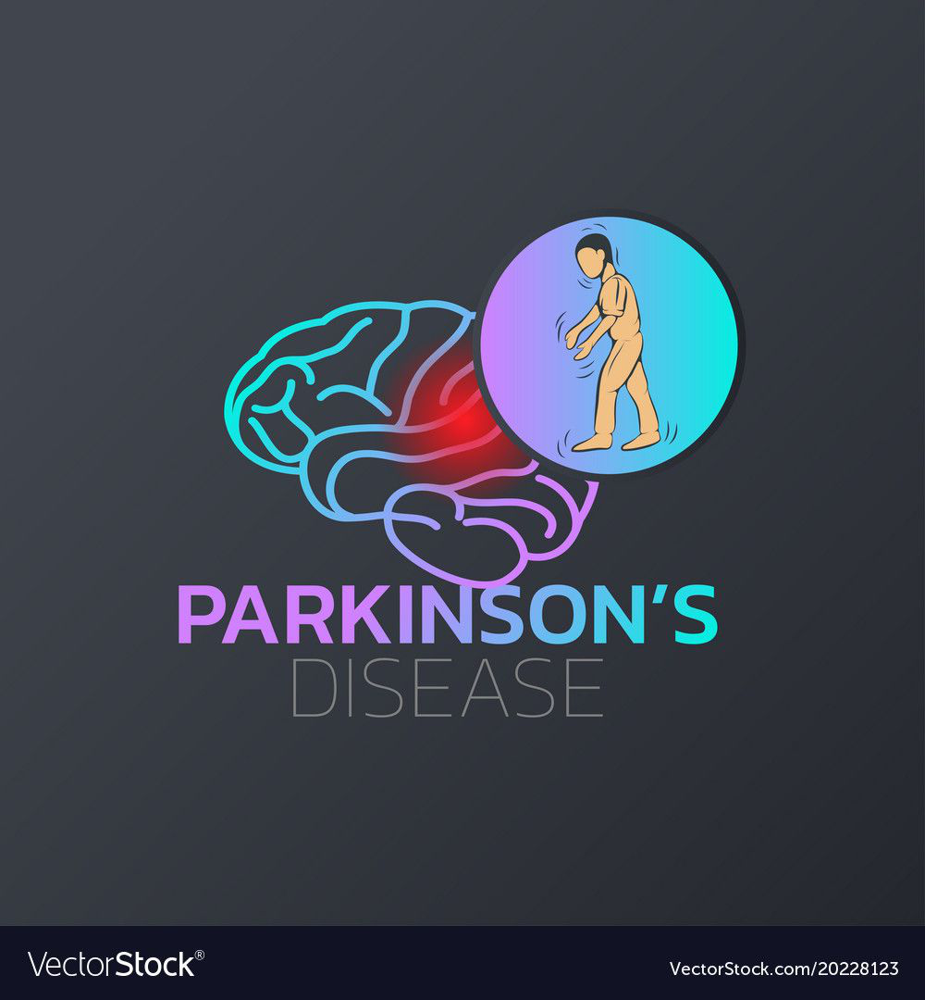

In [1]:
from PIL import Image
img = Image.open("Parkinson's Disease.jpg")
img

# 1. Importing the libraires

In [2]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

#  1.1 Loading the dataset

In [3]:
df = pd.read_csv('Parkinsson disease.csv')

In [4]:
df

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,phon_R01_S50_2,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,phon_R01_S50_3,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,phon_R01_S50_4,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,phon_R01_S50_5,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306


In [5]:
df.shape

(195, 24)

* There Are 195 rows and 24 columns

In [6]:
#removeing the name 
data = df.drop('name',axis = 1)

In [7]:
data

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,0.405,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,0.263,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,0.256,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,0.241,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MDVP:Fo(Hz)       195 non-null    float64
 1   MDVP:Fhi(Hz)      195 non-null    float64
 2   MDVP:Flo(Hz)      195 non-null    float64
 3   MDVP:Jitter(%)    195 non-null    float64
 4   MDVP:Jitter(Abs)  195 non-null    float64
 5   MDVP:RAP          195 non-null    float64
 6   MDVP:PPQ          195 non-null    float64
 7   Jitter:DDP        195 non-null    float64
 8   MDVP:Shimmer      195 non-null    float64
 9   MDVP:Shimmer(dB)  195 non-null    float64
 10  Shimmer:APQ3      195 non-null    float64
 11  Shimmer:APQ5      195 non-null    float64
 12  MDVP:APQ          195 non-null    float64
 13  Shimmer:DDA       195 non-null    float64
 14  NHR               195 non-null    float64
 15  HNR               195 non-null    float64
 16  status            195 non-null    int64  
 1

# 2. Data Cleaning

# 2.1 checking the missing values

In [9]:
import missingno as msno

<AxesSubplot:>

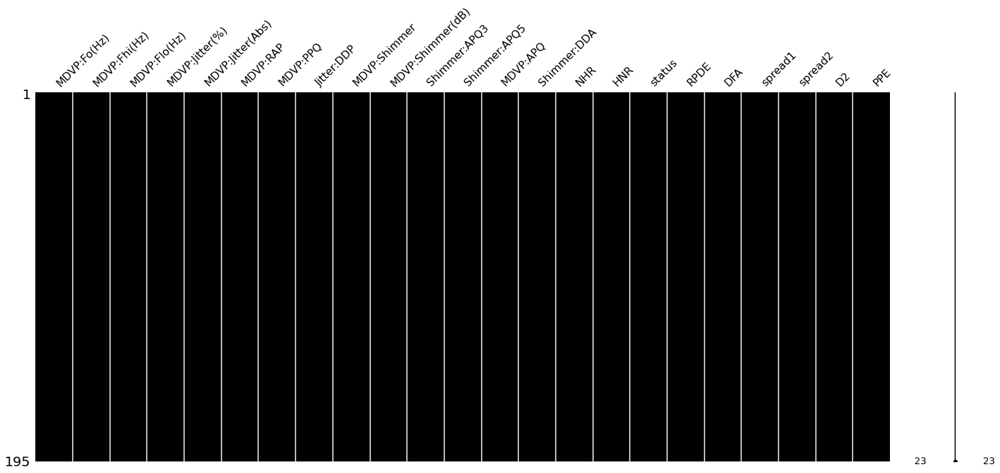

In [10]:
msno.matrix(data, color=(0, 0, 0))

* There Are No NUll values

In [11]:
data.isnull().sum()/len(data)

MDVP:Fo(Hz)         0.0
MDVP:Fhi(Hz)        0.0
MDVP:Flo(Hz)        0.0
MDVP:Jitter(%)      0.0
MDVP:Jitter(Abs)    0.0
MDVP:RAP            0.0
MDVP:PPQ            0.0
Jitter:DDP          0.0
MDVP:Shimmer        0.0
MDVP:Shimmer(dB)    0.0
Shimmer:APQ3        0.0
Shimmer:APQ5        0.0
MDVP:APQ            0.0
Shimmer:DDA         0.0
NHR                 0.0
HNR                 0.0
status              0.0
RPDE                0.0
DFA                 0.0
spread1             0.0
spread2             0.0
D2                  0.0
PPE                 0.0
dtype: float64

# 2.2 checking the duplicate values

In [12]:
data.duplicated().sum()

0

# 3.Visulaization

In [13]:
import seaborn as sns

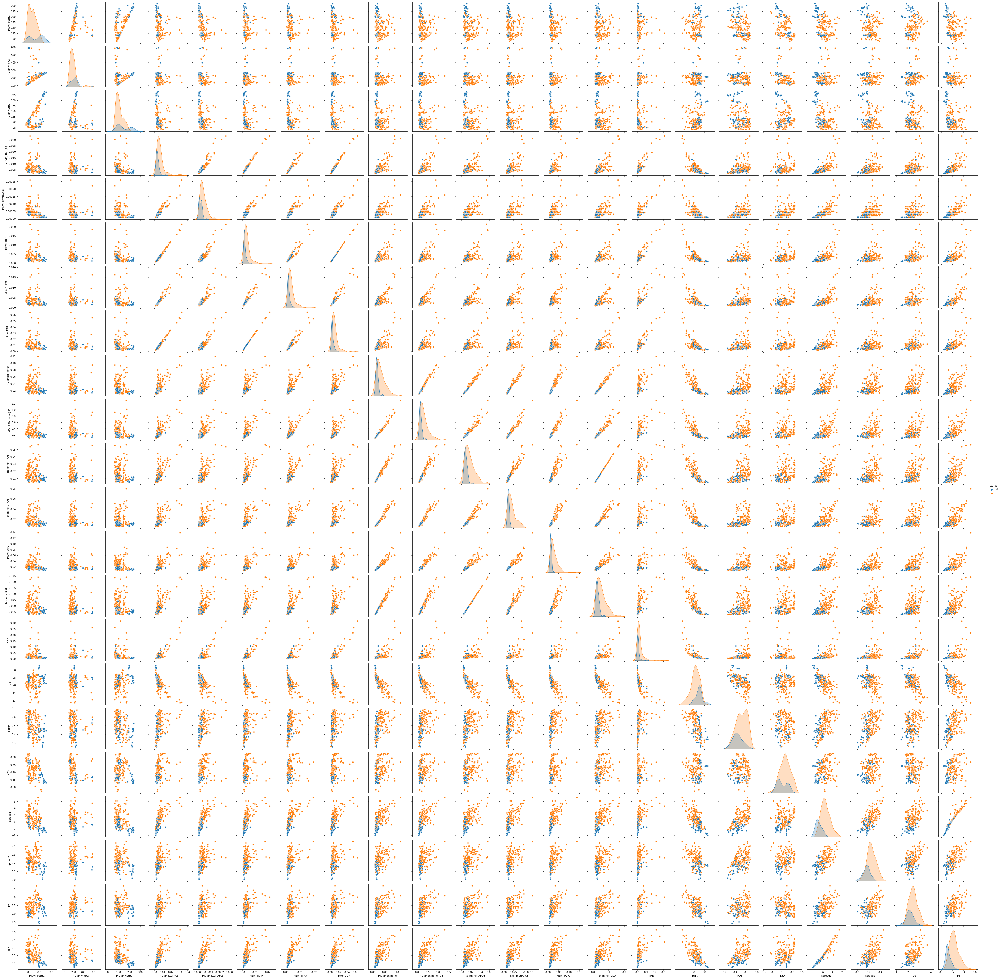

In [14]:
sns.pairplot(data,hue='status')

In [15]:
data.describe().round(2).style.background_gradient(cmap='Blues')

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.230000,197.100000,116.320000,0.010000,0.000000,0.000000,0.000000,0.010000,0.030000,0.280000,0.020000,0.020000,0.020000,0.050000,0.020000,21.890000,0.750000,0.500000,0.720000,-5.680000,0.230000,2.380000,0.210000
std,41.390000,91.490000,43.520000,0.000000,0.000000,0.000000,0.000000,0.010000,0.020000,0.190000,0.010000,0.010000,0.020000,0.030000,0.040000,4.430000,0.430000,0.100000,0.060000,1.090000,0.080000,0.380000,0.090000
min,88.330000,102.140000,65.480000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,0.080000,0.000000,0.010000,0.010000,0.010000,0.000000,8.440000,0.000000,0.260000,0.570000,-7.960000,0.010000,1.420000,0.040000
25%,117.570000,134.860000,84.290000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.150000,0.010000,0.010000,0.010000,0.020000,0.010000,19.200000,1.000000,0.420000,0.670000,-6.450000,0.170000,2.100000,0.140000
50%,148.790000,175.830000,104.320000,0.000000,0.000000,0.000000,0.000000,0.010000,0.020000,0.220000,0.010000,0.010000,0.020000,0.040000,0.010000,22.080000,1.000000,0.500000,0.720000,-5.720000,0.220000,2.360000,0.190000
75%,182.770000,224.210000,140.020000,0.010000,0.000000,0.000000,0.000000,0.010000,0.040000,0.350000,0.020000,0.020000,0.030000,0.060000,0.030000,25.080000,1.000000,0.590000,0.760000,-5.050000,0.280000,2.640000,0.250000
max,260.100000,592.030000,239.170000,0.030000,0.000000,0.020000,0.020000,0.060000,0.120000,1.300000,0.060000,0.080000,0.140000,0.170000,0.310000,33.050000,1.000000,0.690000,0.830000,-2.430000,0.450000,3.670000,0.530000


In [16]:
import plotly.express as px

In [17]:
d = pd.DataFrame(data["status"].value_counts())
fig = px.pie(d, 
             values = "status", 
             names = ["one", "zer0"], 
             hole = 0.5, 
             opacity = 1.0, 
             labels = {"label" : "status", "status" : "Number of Samples"})

fig.update_layout(title = dict(text = "Pie Chart of status"))
fig.update_traces(textposition = "inside", textinfo = "percent+label")
fig.show()

In [18]:
d=data['status'].value_counts()
print(d)
print("1 means parkinson's disease")
print("0 means healthy")

1    147
0     48
Name: status, dtype: int64
1 means parkinson's disease
0 means healthy


# 3.1 Skewness

In [19]:
import matplotlib.pyplot as plt
%matplotlib inline

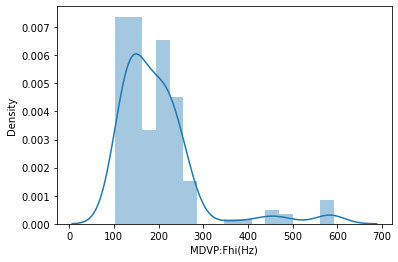

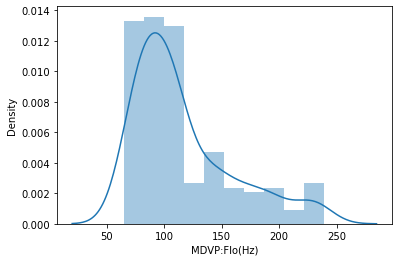

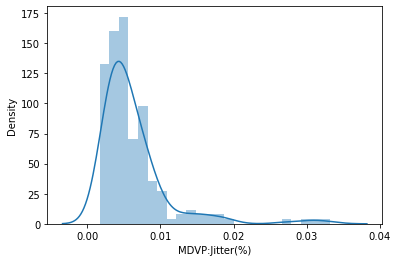

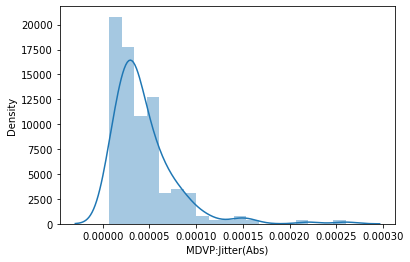

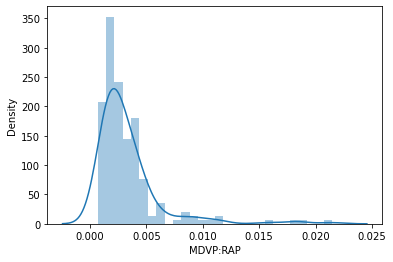

...

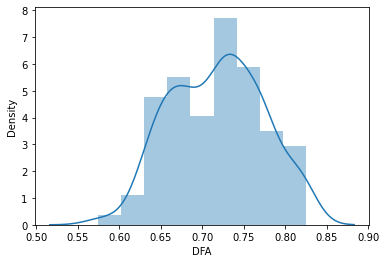

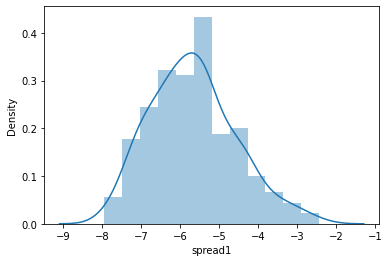

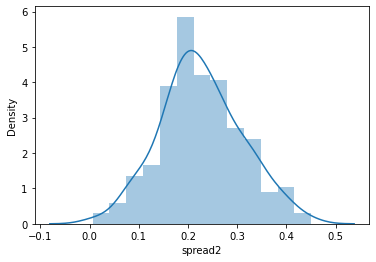

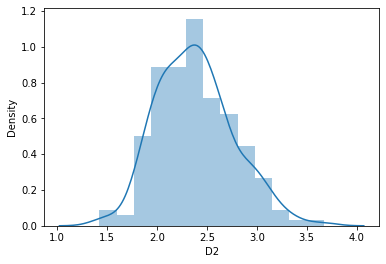

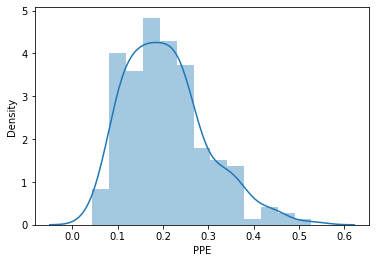

In [20]:
def distplot(col):
    sns.distplot(data[col])
    plt.show()
    
for i in list(data.columns)[1:]:
    distplot(i)

[]

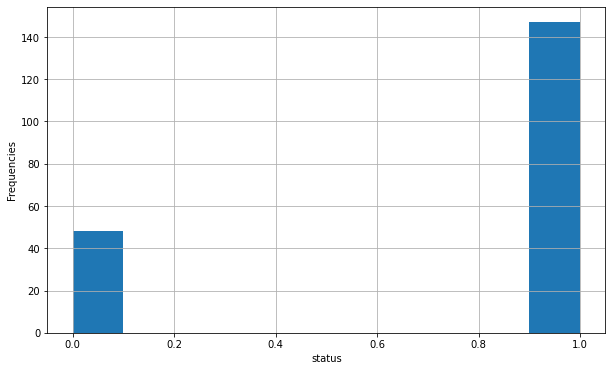

In [21]:
plt.figure(figsize = (10,6))
df.status.hist()  #status column
plt.xlabel('status')
plt.ylabel('Frequencies')
plt.plot()

<AxesSubplot:xlabel='status', ylabel='NHR'>

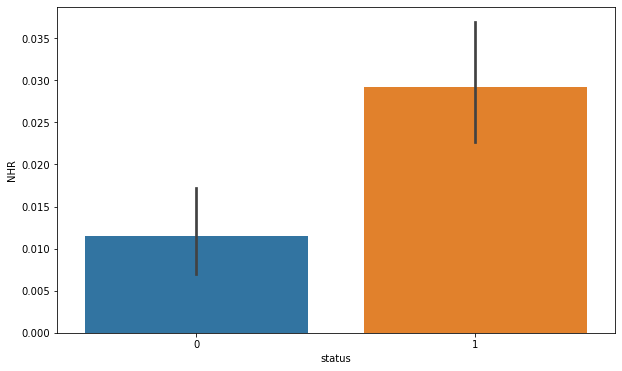

In [22]:
plt.figure(figsize = (10,6))
sns.barplot(x = 'status',y = 'NHR', data = data)

* The persons suffering with Parkinson's disease are having high values of NHR in comparision to healthy people.

<AxesSubplot:xlabel='status', ylabel='HNR'>

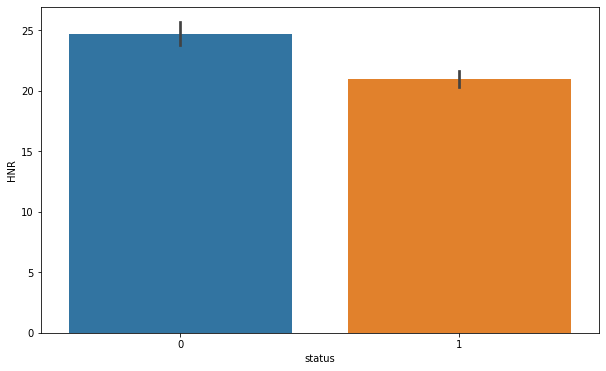

In [23]:
plt.figure(figsize = (10,6))
sns.barplot(x = 'status',y = 'HNR', data = data)

* Healthy persons are having high HNR in comparision to PD Affected person's

<AxesSubplot:xlabel='status', ylabel='MDVP:Fo(Hz)'>

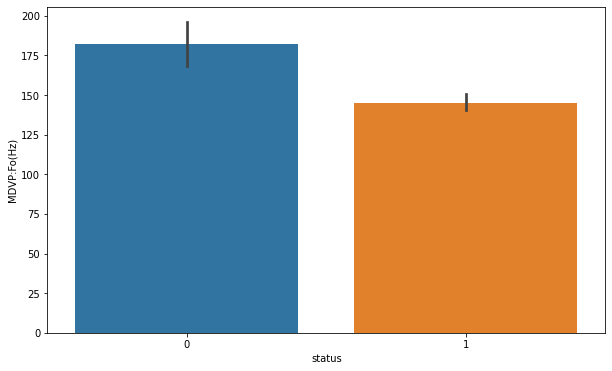

In [24]:
plt.figure(figsize = (10,6))
sns.barplot(x = 'status',y = 'MDVP:Fo(Hz)', data = data)

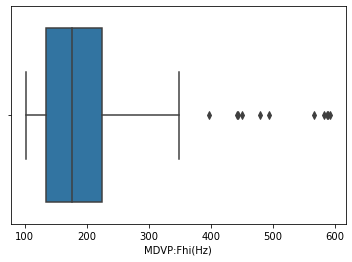

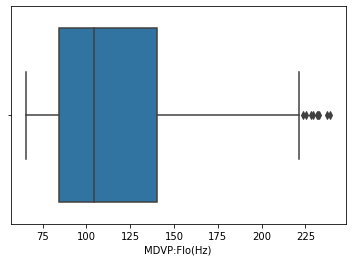

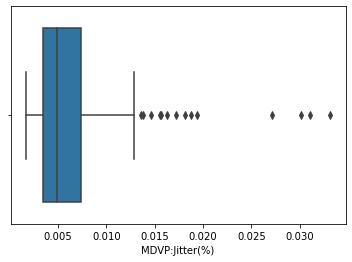

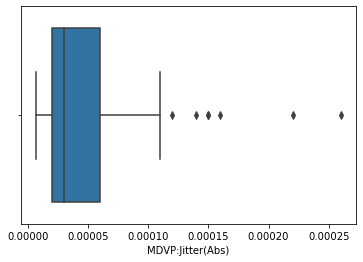

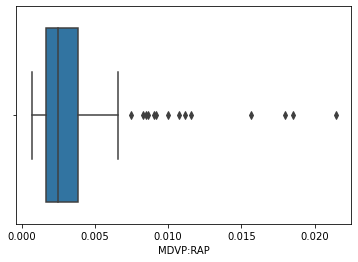

...

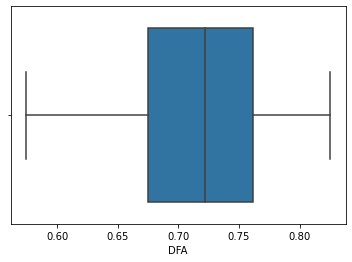

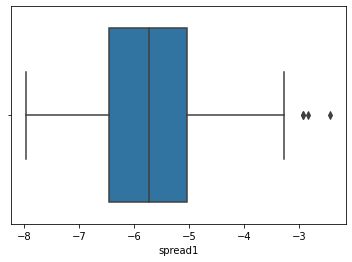

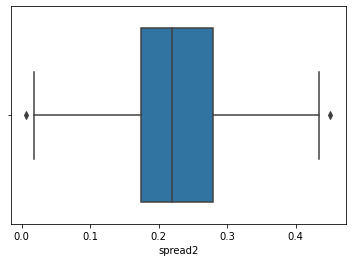

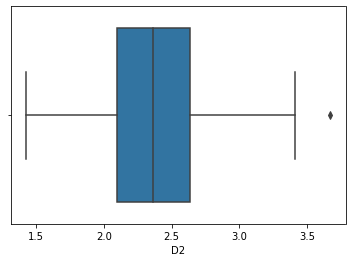

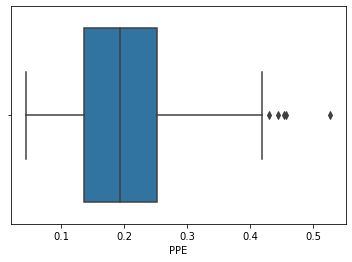

In [25]:
# find the distribution of plots
def boxplot(col):
    sns.boxplot(data[col])
    plt.show()
    
for i in list(data.select_dtypes(exclude=['object']).columns)[1:]:
    boxplot(i)

<AxesSubplot:>

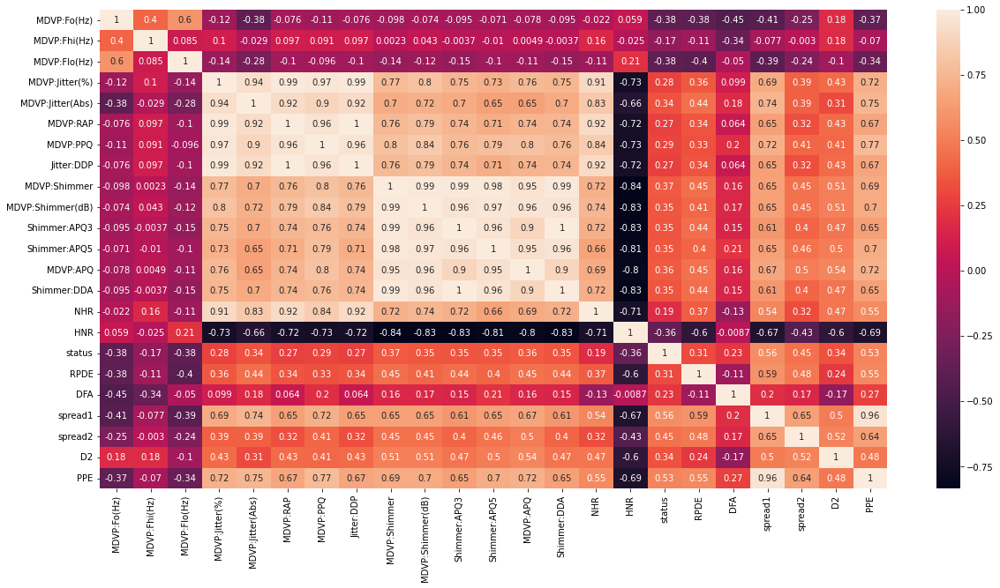

In [26]:
plt.figure(figsize=(20, 10))
sns.heatmap(data.corr(),annot=True)

In [27]:
corr_matrix = data.corr()

In [28]:
 corr_matrix["status"].sort_values(ascending=False)

status              1.000000
spread1             0.564838
PPE                 0.531039
spread2             0.454842
MDVP:Shimmer        0.367430
MDVP:APQ            0.364316
Shimmer:APQ5        0.351148
MDVP:Shimmer(dB)    0.350697
Shimmer:APQ3        0.347617
Shimmer:DDA         0.347608
D2                  0.340232
MDVP:Jitter(Abs)    0.338653
RPDE                0.308567
MDVP:PPQ            0.288698
MDVP:Jitter(%)      0.278220
MDVP:RAP            0.266668
Jitter:DDP          0.266646
DFA                 0.231739
NHR                 0.189429
MDVP:Fhi(Hz)       -0.166136
HNR                -0.361515
MDVP:Flo(Hz)       -0.380200
MDVP:Fo(Hz)        -0.383535
Name: status, dtype: float64

# Feature Engineering

In [29]:
#removing columns which have high variance
from sklearn.feature_selection import VarianceThreshold

In [30]:
var_th = VarianceThreshold(threshold=0.01)
var_th.fit(data)

VarianceThreshold(threshold=0.01)

In [31]:
var_th.get_support()

array([ True,  True,  True, False, False, False, False, False, False,
        True, False, False, False, False, False,  True,  True,  True,
       False,  True, False,  True, False])

In [32]:
data.columns[var_th.get_support()]

Index(['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Shimmer(dB)',
       'HNR', 'status', 'RPDE', 'spread1', 'D2'],
      dtype='object')

In [33]:
constant_columns = [column for column in data.columns
                   if column not in data.columns[var_th.get_support()]]
print(len(constant_columns))

14


In [34]:
for feature in constant_columns:
    print(feature)

MDVP:Jitter(%)
MDVP:Jitter(Abs)
MDVP:RAP
MDVP:PPQ
Jitter:DDP
MDVP:Shimmer
Shimmer:APQ3
Shimmer:APQ5
MDVP:APQ
Shimmer:DDA
NHR
DFA
spread2
PPE


In [35]:
new = data.drop(constant_columns,axis = 1)

In [36]:
new

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Shimmer(dB),HNR,status,RPDE,spread1,D2
0,119.992,157.302,74.997,0.426,21.033,1,0.414783,-4.813031,2.301442
1,122.400,148.650,113.819,0.626,19.085,1,0.458359,-4.075192,2.486855
2,116.682,131.111,111.555,0.482,20.651,1,0.429895,-4.443179,2.342259
3,116.676,137.871,111.366,0.517,20.644,1,0.434969,-4.117501,2.405554
4,116.014,141.781,110.655,0.584,19.649,1,0.417356,-3.747787,2.332180
...,...,...,...,...,...,...,...,...,...
190,174.188,230.978,94.261,0.405,19.517,0,0.448439,-6.538586,2.657476
191,209.516,253.017,89.488,0.263,19.147,0,0.431674,-6.195325,2.784312
192,174.688,240.005,74.287,0.256,17.883,0,0.407567,-6.787197,2.679772
193,198.764,396.961,74.904,0.241,19.020,0,0.451221,-6.744577,2.138608


# Model Building

In [37]:
final = new.rename(columns = {'MDVP:Fo(Hz)':'Fo','MDVP:Fhi(Hz)':'Fhi','MDVP:Flo(Hz)':'Flo','MDVP:Shimmer(dB)':'Shimmer'})

In [38]:
final

,Fo,Fhi,Flo,Shimmer,HNR,status,RPDE,spread1,D2
0,119.992,157.302,74.997,0.426,21.033,1,0.414783,-4.813031,2.301442
1,122.400,148.650,113.819,0.626,19.085,1,0.458359,-4.075192,2.486855
2,116.682,131.111,111.555,0.482,20.651,1,0.429895,-4.443179,2.342259
3,116.676,137.871,111.366,0.517,20.644,1,0.434969,-4.117501,2.405554
4,116.014,141.781,110.655,0.584,19.649,1,0.417356,-3.747787,2.332180
...,...,...,...,...,...,...,...,...,...
190,174.188,230.978,94.261,0.405,19.517,0,0.448439,-6.538586,2.657476
191,209.516,253.017,89.488,0.263,19.147,0,0.431674,-6.195325,2.784312
192,174.688,240.005,74.287,0.256,17.883,0,0.407567,-6.787197,2.679772
193,198.764,396.961,74.904,0.241,19.020,0,0.451221,-6.744577,2.138608


In [39]:
X = final.drop('status', axis = 1)
y = final.status

In [40]:
X

,Fo,Fhi,Flo,Shimmer,HNR,RPDE,spread1,D2
0,119.992,157.302,74.997,0.426,21.033,0.414783,-4.813031,2.301442
1,122.400,148.650,113.819,0.626,19.085,0.458359,-4.075192,2.486855
2,116.682,131.111,111.555,0.482,20.651,0.429895,-4.443179,2.342259
3,116.676,137.871,111.366,0.517,20.644,0.434969,-4.117501,2.405554
4,116.014,141.781,110.655,0.584,19.649,0.417356,-3.747787,2.332180
...,...,...,...,...,...,...,...,...
190,174.188,230.978,94.261,0.405,19.517,0.448439,-6.538586,2.657476
191,209.516,253.017,89.488,0.263,19.147,0.431674,-6.195325,2.784312
192,174.688,240.005,74.287,0.256,17.883,0.407567,-6.787197,2.679772
193,198.764,396.961,74.904,0.241,19.020,0.451221,-6.744577,2.138608


In [41]:
y

0      1
1      1
2      1
3      1
4      1
      ..
190    0
191    0
192    0
193    0
194    0
Name: status, Length: 195, dtype: int64

# Imbalance Of the data

In [42]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, 
random_state = 2, shuffle = True, stratify = y)

In [43]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
scaler.fit(X_train)
X_train=scaler.fit_transform(X_train)
X_test=scaler.fit_transform(X_test)

In [44]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 42)
X_train_new, y_train_new = sm.fit_resample(X_train, y_train)

In [45]:
import keras 
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout

In [46]:
classifier = Sequential()
classifier.add(Dense(units = 6, kernel_initializer='he_uniform',activation = 'relu', input_dim =8 ))
classifier.add(Dense(units = 6, kernel_initializer='he_uniform',activation = 'relu', input_dim = 8))
classifier.add(Dense(units = 1, kernel_initializer='glorot_uniform',activation = 'sigmoid'))

In [47]:
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [48]:
model_history = classifier.fit(X_train_new,y_train_new, validation_split = 0.30, batch_size = 10, epochs = 200)

Epoch 1/200
14/14 [==============================] - 3s 41ms/step - loss: 0.6446 - accuracy: 0.7299 - val_loss: 0.7786 - val_accuracy: 0.1017
Epoch 2/200
14/14 [==============================] - 0s 6ms/step - loss: 0.6313 - accuracy: 0.7299 - val_loss: 0.8116 - val_accuracy: 0.0508
Epoch 3/200
14/14 [==============================] - 0s 7ms/step - loss: 0.6172 - accuracy: 0.7226 - val_loss: 0.8459 - val_accuracy: 0.0169
Epoch 4/200
14/14 [==============================] - 0s 7ms/step - loss: 0.6038 - accuracy: 0.7226 - val_loss: 0.8813 - val_accuracy: 0.0000e+00
Epoch 5/200
14/14 [==============================] - 0s 7ms/step - loss: 0.5908 - accuracy: 0.7226 - val_loss: 0.9127 - val_accuracy: 0.0000e+00
Epoch 6/200
14/14 [==============================] - 0s 7ms/step - loss: 0.5768 - accuracy: 0.7226 - val_loss: 0.9456 - val_accuracy: 0.0000e+00
Epoch 7/200
14/14 [==============================] - 0s 8ms/step - loss: 0.5663 - accuracy: 0.7153 - val_loss: 0.9857 - val_accuracy: 0.0000e

14/14 [==============================] - 0s 7ms/step - loss: 0.3385 - accuracy: 0.8394 - val_loss: 0.6514 - val_accuracy: 0.6102
Epoch 59/200
14/14 [==============================] - 0s 8ms/step - loss: 0.3373 - accuracy: 0.8394 - val_loss: 0.6450 - val_accuracy: 0.6102
Epoch 60/200
14/14 [==============================] - 0s 7ms/step - loss: 0.3360 - accuracy: 0.8394 - val_loss: 0.6472 - val_accuracy: 0.6102
Epoch 61/200
14/14 [==============================] - 0s 7ms/step - loss: 0.3345 - accuracy: 0.8394 - val_loss: 0.6511 - val_accuracy: 0.6102
Epoch 62/200
14/14 [==============================] - 0s 8ms/step - loss: 0.3333 - accuracy: 0.8394 - val_loss: 0.6470 - val_accuracy: 0.6102
Epoch 63/200
14/14 [==============================] - 0s 7ms/step - loss: 0.3334 - accuracy: 0.8394 - val_loss: 0.6677 - val_accuracy: 0.5932
Epoch 64/200
14/14 [==============================] - 0s 7ms/step - loss: 0.3314 - accuracy: 0.8321 - val_loss: 0.6379 - val_accuracy: 0.6102
Epoch 65/200
14/14 

14/14 [==============================] - 0s 7ms/step - loss: 0.2969 - accuracy: 0.8467 - val_loss: 0.5835 - val_accuracy: 0.6271
Epoch 116/200
14/14 [==============================] - 0s 8ms/step - loss: 0.2953 - accuracy: 0.8467 - val_loss: 0.5825 - val_accuracy: 0.6441
Epoch 117/200
14/14 [==============================] - 0s 9ms/step - loss: 0.2961 - accuracy: 0.8540 - val_loss: 0.5534 - val_accuracy: 0.6949
Epoch 118/200
14/14 [==============================] - 0s 6ms/step - loss: 0.2950 - accuracy: 0.8686 - val_loss: 0.5764 - val_accuracy: 0.6780
Epoch 119/200
14/14 [==============================] - 0s 6ms/step - loss: 0.2939 - accuracy: 0.8467 - val_loss: 0.5773 - val_accuracy: 0.6780
Epoch 120/200
14/14 [==============================] - 0s 8ms/step - loss: 0.2969 - accuracy: 0.8686 - val_loss: 0.5452 - val_accuracy: 0.7288
Epoch 121/200
14/14 [==============================] - 0s 7ms/step - loss: 0.2942 - accuracy: 0.8613 - val_loss: 0.5907 - val_accuracy: 0.6102
Epoch 122/200

14/14 [==============================] - 0s 7ms/step - loss: 0.2752 - accuracy: 0.8613 - val_loss: 0.5204 - val_accuracy: 0.7288
Epoch 173/200
14/14 [==============================] - 0s 7ms/step - loss: 0.2748 - accuracy: 0.8686 - val_loss: 0.5269 - val_accuracy: 0.7288
Epoch 174/200
14/14 [==============================] - 0s 8ms/step - loss: 0.2748 - accuracy: 0.8613 - val_loss: 0.5448 - val_accuracy: 0.6949
Epoch 175/200
14/14 [==============================] - 0s 7ms/step - loss: 0.2759 - accuracy: 0.8540 - val_loss: 0.5168 - val_accuracy: 0.7288
Epoch 176/200
14/14 [==============================] - 0s 7ms/step - loss: 0.2746 - accuracy: 0.8540 - val_loss: 0.5560 - val_accuracy: 0.6949
Epoch 177/200
14/14 [==============================] - 0s 7ms/step - loss: 0.2735 - accuracy: 0.8540 - val_loss: 0.5371 - val_accuracy: 0.6949
Epoch 178/200
14/14 [==============================] - 0s 7ms/step - loss: 0.2731 - accuracy: 0.8686 - val_loss: 0.5325 - val_accuracy: 0.7288
Epoch 179/200

In [49]:
print(model_history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


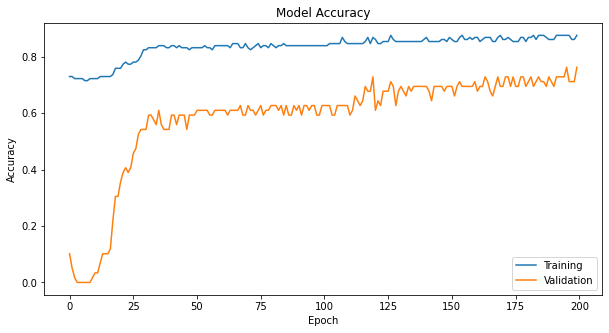

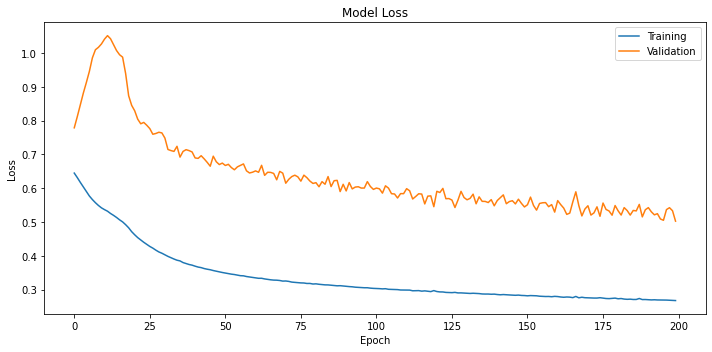

In [50]:
# summarize history for accuracy


plt.figure(figsize=(10,5))
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='lower right')


# summarize history for loss


plt.figure(figsize=(10,5))
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper right')


plt.tight_layout()

plt.show()

In [51]:
from sklearn.metrics import confusion_matrix

In [52]:
y_pred = classifier.predict(X_test)
y_pred = (y_pred>0.5)

3/3 [==============================] - 0s 11ms/step


In [53]:
confusion_matrix(y_test,y_pred)

array([[12,  4],
       [ 7, 42]], dtype=int64)

In [54]:
from sklearn.metrics import classification_report

In [55]:
from sklearn import metrics

In [56]:
from sklearn.metrics import f1_score,precision_score,confusion_matrix,recall_score

In [57]:
print("\n Classification report for Model  %s:\n%s\n" % (model_history, metrics.classification_report(y_test, y_pred)))


 Classification report for Model  <keras.callbacks.History object at 0x000002B73F3BD790>:
              precision    recall  f1-score   support

           0       0.63      0.75      0.69        16
           1       0.91      0.86      0.88        49

    accuracy                           0.83        65
   macro avg       0.77      0.80      0.78        65
weighted avg       0.84      0.83      0.84        65




# Pickle

In [58]:
import pickle

In [59]:
pickle.dump(final,open('final.pkl','wb'))
pickle.dump(model_history,open('model_history.pkl','wb'))

INFO:tensorflow:Assets written to: ram://9810c0c4-02ef-4a84-9b2f-3c169d07bcc7/assets
